# Libraries, functions and settings

In [1]:
# Utilities
import geopandas as gpd
import pandas as pd
import numpy as np

# Save and load data
import os
import pickle

# Machine Learning and analysis
from sklearn.model_selection import GridSearchCV 
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(context = 'notebook', style = "darkgrid", color_codes=False) 

# My own functions
from f import *

## Settings

In [2]:
# Choose whether to save or not the plots
save_plot = True

# Choose the data to use
## Year
year = '2018'
## Resolution of data hexagones
res = '09'
## Land cover
lc_id = '14'
lc = 'Croplands_NaturalVegetationMosaics'

# Train-Test percentage
train_size = 0.9
test_size = 0.1

# ccp_alpha used in the classic analysis
ccp_alpha = [0, 1.31e-06, 3.36e-06]

# Buffering areas width in degrees
buffer = 1

## Directories

In [3]:
# Data directories
data_dir = f'Ecosphere/ISEA3H{res}'
centroids_dir = 'Spatial'
processed_data_dir = f'Output/{lc_id}. {lc}/Processed data/TTS{int(train_size*100)}{int(test_size*100)} SpatialCV B{buffer}'
plot_dir = f'Output/{lc_id}. {lc}/Plots/TTS{int(train_size*100)}{int(test_size*100)} SpatialCV B{buffer}'
train_test_data_dir = f'Output/{lc_id}. {lc}/Train and Test sets'

In [4]:
# Create directories
os.makedirs(processed_data_dir, exist_ok = True)
os.makedirs(plot_dir, exist_ok = True)

# Data

In [5]:
# Import the data of all and only the hexagons such that:
# - at least one bioclimatic variable is available
# - they ar not only composed of water bodies

data = ImportLandData(year, res, data_dir, centroids_dir, stats = False)

## Data preparation for Machine Learning

Let us retrieve the same train and test sets used in the analysis with classic cross-validation.

In [6]:
# Directory where train-test data are stored 
file_dir = os.path.join(train_test_data_dir,
                        f'TrainTestSplit_{int(train_size*100)}{int(test_size*100)}.pickle')

with open(file_dir, 'rb') as file: 
    X_train, X_test, y_train, y_test = pickle.load(file)

# Geometry column of the training set, needed in order to apply the Spatial CV 
XTG = data.loc[X_train.index, ['geometry']]

## Data from analysis with classical cross-validation 

Let us retrieve the grid search results obtained in the analysis with classic cross-validation. 

### Regression trees

In [7]:
# Directory where Grid Search results are stored
file_dir = os.path.join(processed_data_dir[:-13], 'DTR_GS.pickle')

with open(file_dir, 'rb') as file: DTR_GS = pickle.load(file)

# Grid search results
DTR_GS_results = pd.DataFrame(DTR_GS.cv_results_)

### Random Forests

In [8]:
# Directory where Grid Search results are stored
file_dir = os.path.join(processed_data_dir[:-13], 'RFR_GS.pickle')

with open(file_dir, 'rb') as file: RFR_GS = pickle.load(file)
    
# Grid search results
RFR_GS_results = pd.DataFrame(RFR_GS.cv_results_)

# Regression trees 

Likewise the analysis with classical cross-validation, in the following we keep the same outline. The main difference is how the points are split during the cross-validation (inside the grid search): it is not performed randomly, but according to a reference coordinate (longitude or latitude). We refer to this different approach as **Spatial cross-validation**. 

## Generation of training-validation sets for spatial CV

### Along longitude coordinates

In [9]:
# Number of folds
k = 5
# Generation of training-validation sets
folds_indices_x = SpatialCVSplit(XTG, k, buffer = buffer, eps = 2) ## Pandas indices
folds_rows_x = Index2RowNum(folds_indices_x, X_train) ## Row numbers

Preparing training set 1 bounds
Preparing training set 2 bounds
Preparing training set 3 bounds
Preparing training set 4 bounds
Preparing training set 5 bounds

Preparing validation sets bounds

Assigning points to training and validation sets

Converting pandas indices into row numbers.


In [10]:
# Counts and proportions of training, validation sets and buffering areas.
FoldsStats(folds_indices_x, tot_size = X_train.shape[0])

,TrainSetSize,ValidationSetSize,BufferingSize,TrainSetProp,ValidationSetProp,BufferingProp
Fold1,40750,9885,390,79.86,19.37,0.76
Fold2,40488,10244,293,79.35,20.08,0.57
Fold3,40416,10245,364,79.21,20.08,0.71
Fold4,40879,9647,499,80.12,18.91,0.98
Fold5,41172,9609,244,80.69,18.83,0.48


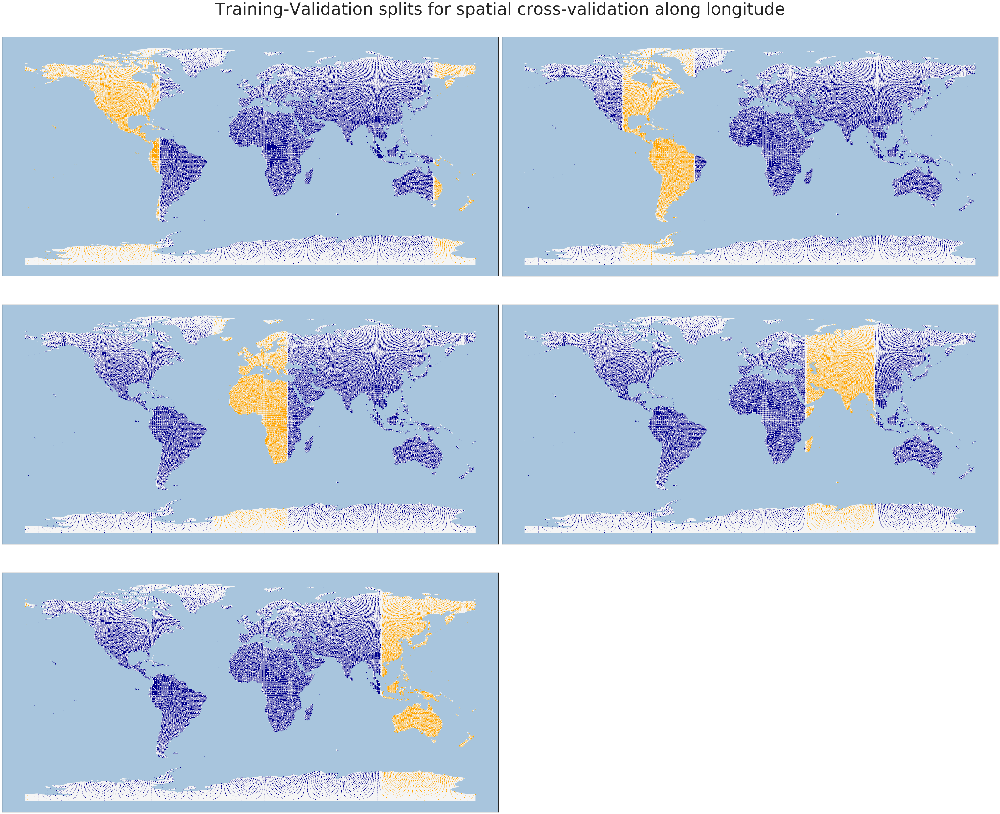

In [11]:
# Visualize training and validation set for each fold of the Spatial CV.
## Buffering areas are the white stripes (no points) around the validation set
with sns.axes_style("white"):
    fig, axs = plt.subplots(nrows = k//2+1, ncols = 2, figsize = (50, 13.5*(k//2+1)))

    for (train, val), ax in zip(folds_indices_x, axs.flat):
        # Training set
        XTG.loc[train].plot(ax = ax, zorder = 2, markersize = 1, marker = 'h',
                            color = 'darkblue', legend = True)
        # Validation set
        XTG.loc[val].plot(ax = ax, zorder = 2, markersize = 1, marker = 'h',
                          color = 'orange', legend = True)

        # World map on the backgroud
        world.plot(ax = ax, zorder = 1, facecolor = "whitesmoke",
                   edgecolor = "none").set_facecolor('#A8C5DD')
        
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    if k%2 == 1: fig.delaxes(axs.flat[-1])
    
    fig.tight_layout()
    
    if save_plot:
        plt.savefig(os.path.join(plot_dir, f'IGBP{lc_id}_{k}FoldSpatialCV_X.jpg'),
                    optimize = True, box_inches = 'tight', dpi = 200)
    fig.suptitle('Training-Validation splits for spatial cross-validation along longitude', 
                 y = 1.02, fontsize = 60)
    
    plt.show()

### Along latitude coordinates

In [12]:
# Number of folds
k = 5
# Generation of training-validation sets
folds_indices_y = SpatialCVSplit(XTG, k, coord = 'y', buffer = buffer, eps = 2) ## Pandas indices
folds_rows_y = Index2RowNum(folds_indices_y, X_train) ## Row numbers

Preparing training set 1 bounds
Preparing training set 2 bounds
Preparing training set 3 bounds
Preparing training set 4 bounds
Preparing training set 5 bounds

Preparing validation sets bounds

Assigning points to training and validation sets

Converting pandas indices into row numbers.


In [13]:
# Counts and proportions of training, validation sets and buffering areas.
FoldsStats(folds_indices_y, tot_size = X_train.shape[0])

,TrainSetSize,ValidationSetSize,BufferingSize,TrainSetProp,ValidationSetProp,BufferingProp
Fold1,40670,9985,370,79.71,19.57,0.73
Fold2,40650,9990,385,79.67,19.58,0.75
Fold3,41056,9238,731,80.46,18.10,1.43
Fold4,40922,9056,1047,80.20,17.75,2.05
Fold5,40546,9851,628,79.46,19.31,1.23


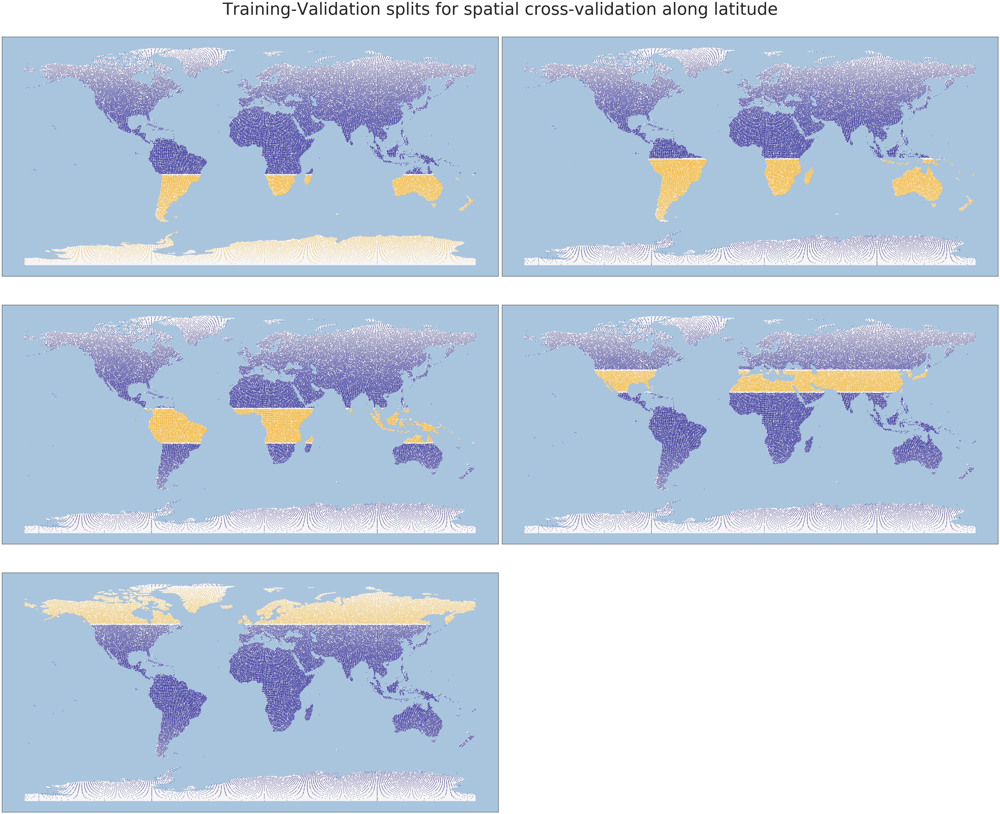

In [14]:
# Visualize training and validation set for each fold of the Spatial CV.
## Buffering areas are the white stripes (no points) around the validation set
with sns.axes_style("white"):
    fig, axs = plt.subplots(nrows = k//2+1, ncols = 2, figsize = (50, 13.5*(k//2+1)))

    for (train, val), ax in zip(folds_indices_y, axs.flat):
        # Training set
        XTG.loc[train].plot(ax = ax, zorder = 2, markersize = 1, marker = 'h',
                            color = 'darkblue', legend = True)
        # Validation set
        XTG.loc[val].plot(ax = ax, zorder = 2, markersize = 1, marker = 'h',
                          color = 'orange', legend = True)

        # World map on the backgroud
        world.plot(ax = ax, zorder = 1, facecolor = "whitesmoke",
                   edgecolor = "none").set_facecolor('#A8C5DD')
        
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    if k%2 == 1: fig.delaxes(axs.flat[-1])
    
    fig.tight_layout()
    
    if save_plot: 
        plt.savefig(os.path.join(plot_dir, f'IGBP{lc_id}_{k}FoldSpatialCV_Y.jpg'),
                    optimize = True, box_inches = 'tight', dpi = 200)
    fig.suptitle('Training-Validation splits for spatial cross-validation along latitude', 
                 y = 1.02, fontsize = 60)
    
    plt.show()

## Search of parameters

### Grid search along longitude coordinates

In [15]:
# Range of max_dept
d_min, d_max = 2, 27

# Hyperparameters for the Grid Search
hyperparams = {'max_depth': list(range(d_min, d_max)), 
               'min_samples_split': [2, 5, 10, 15],
               'ccp_alpha': ccp_alpha}

# Directory to store the Grid Search results
file_dir = os.path.join(processed_data_dir,'DTR_GS_SX.pickle')

if os.path.exists(file_dir):
    with open(file_dir, 'rb') as file: DTR_GS_SX = pickle.load(file)
    print('Grid Search loaded')
else:
    # Grid Search and k-fold CV
    DTR_GS_SX = GridSearchCV(estimator = DecisionTreeRegressor(criterion = 'mse',
                                                              splitter = 'best'),
                            param_grid = hyperparams,
                            scoring = 'neg_mean_squared_error',
                            cv = folds_rows_x,
                            return_train_score = True,
                            n_jobs = 4,
                            verbose = 5)
    
    DTR_GS_SX.fit(X_train, y_train)

    with open(file_dir, 'wb') as file: pickle.dump(DTR_GS_SX, file)
    print('Grid Search executed')

# Grid Search results
DTR_GS_SX_results = pd.DataFrame(DTR_GS_SX.cv_results_)

Grid Search loaded


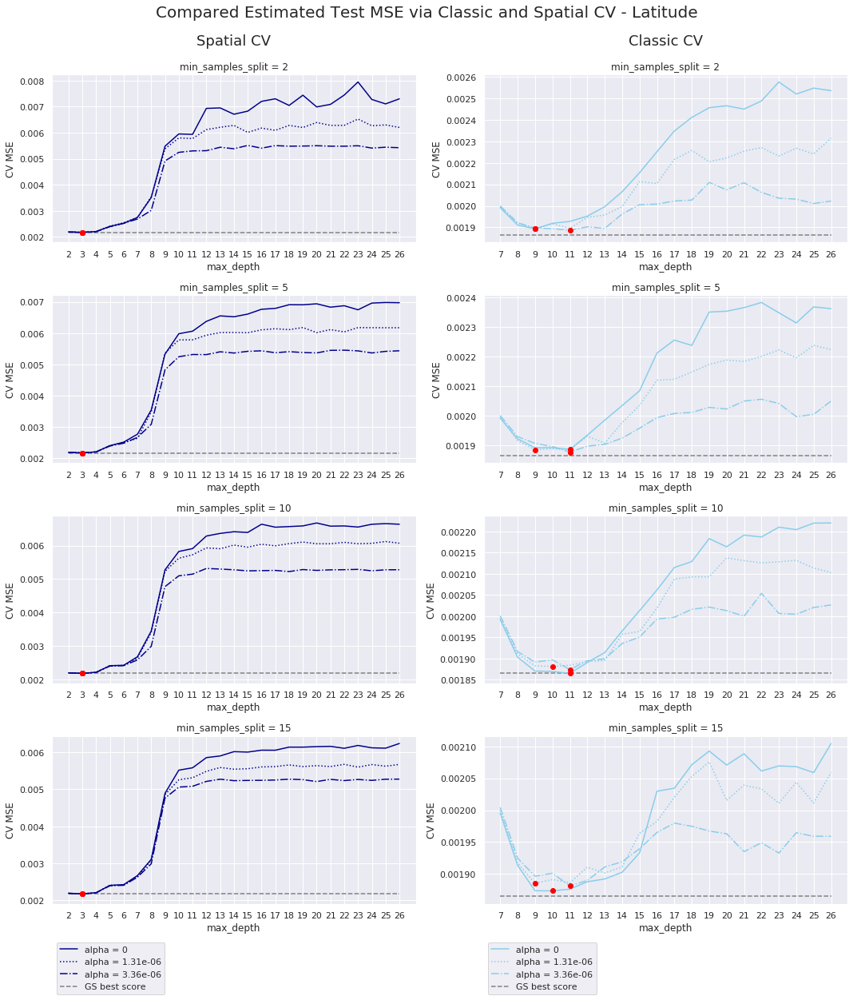

In [16]:
fig, ax = plt.subplots(nrows = 4, ncols = 2, figsize = (15,17))

ls = ['-', ':', '-.']
col = ['darkblue', 'skyblue']

for j in range(2):
    for i, mss in enumerate(hyperparams['min_samples_split']):
        for k, alpha in enumerate(ccp_alpha):
            if j == 0: 
                R = DTR_GS_SX_results
                d_min = 2
            else: 
                R = DTR_GS_results[DTR_GS_results.param_splitter == 'best']
                d_min = 7
                
            MSE = R[(R.param_min_samples_split == mss) & 
                    (R.param_ccp_alpha == alpha)].mean_test_score.values*-1
            ax[i,j].plot(list(range(d_min, d_max)), MSE, linestyle = ls[k], 
                       color = col[j], label = f'alpha = {alpha}', zorder = 1)
            ax[i,j].scatter(d_min+np.argmin(MSE), min(MSE), color = 'red', zorder = 2)

        ax[i,j].hlines(R.mean_test_score.max()*-1, xmin = d_min, xmax = d_max-1, zorder = 1,
                     color = 'gray', linestyles = 'dashed', label = f'GS best score')

        ax[i,j].set(xticks = list(range(d_min, d_max)), title = f'min_samples_split = {mss}',
                  xlabel = 'max_depth', ylabel = 'CV MSE')

    ax[-1,j].legend(bbox_to_anchor = (0, -0.2), loc = "upper left")
ax[0,0].text(x = 0.5, y = 1.2, s = "Spatial CV", size = 18, horizontalalignment='center',
             verticalalignment='center', transform = ax[0,0].transAxes)
ax[0,1].text(x = 0.5, y = 1.2, s = "Classic CV", size = 18, horizontalalignment='center',
             verticalalignment='center', transform = ax[0,1].transAxes)

fig.tight_layout()

if save_plot:
    plt.savefig(os.path.join(plot_dir, f'IGBP{lc_id}_DTR_GS_SX_results.jpg'),
                optimize = True, box_inches = 'tight', dpi = 200)
fig.suptitle('Compared Estimated Test MSE via Classic and Spatial CV - Latitude',
             y = 1.02, size = 20)
plt.show()

### Grid search along latitude coordinates

In [17]:
# Range of max_dept
d_min, d_max = 2, 27

# Hyperparameters for the Grid Search
hyperparams = {'max_depth': list(range(d_min, d_max)), 
               'min_samples_split': [2, 5, 10, 15],
               'ccp_alpha': ccp_alpha}

# Directory to store the Grid Search results
file_dir = os.path.join(processed_data_dir,'DTR_GS_SY.pickle')

if os.path.exists(file_dir):
    with open(file_dir, 'rb') as file: DTR_GS_SY = pickle.load(file)
    print('Grid Search loaded')
else:
    # Grid Search and k-fold CV
    DTR_GS_SY = GridSearchCV(estimator = DecisionTreeRegressor(criterion = 'mse',
                                                              splitter = 'best'),
                            param_grid = hyperparams,
                            scoring = 'neg_mean_squared_error',
                            cv = folds_rows_y,
                            return_train_score = True,
                            n_jobs = 4,
                            verbose = 5)
    
    DTR_GS_SY.fit(X_train, y_train)

    with open(file_dir, 'wb') as file: pickle.dump(DTR_GS_SY, file)
    print('Grid Search executed')

# Grid Search results
DTR_GS_SY_results = pd.DataFrame(DTR_GS_SY.cv_results_)

Grid Search loaded


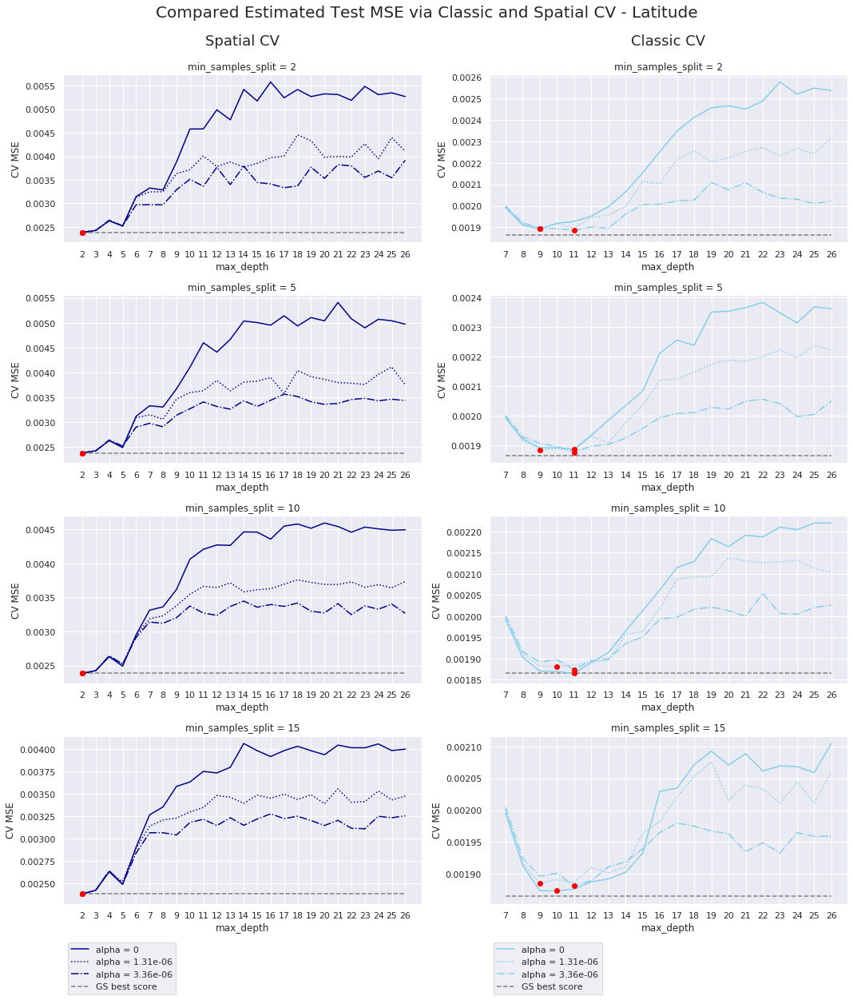

In [18]:
fig, ax = plt.subplots(nrows = 4, ncols = 2, figsize = (15,17))

ls = ['-', ':', '-.']
col = ['darkblue', 'skyblue']

for j in range(2):
    for i, mss in enumerate(hyperparams['min_samples_split']):
        for k, alpha in enumerate(ccp_alpha):
            if j == 0: 
                R = DTR_GS_SY_results
                d_min = 2
            else: 
                R = DTR_GS_results[DTR_GS_results.param_splitter == 'best']
                d_min = 7
                
            MSE = R[(R.param_min_samples_split == mss) & 
                    (R.param_ccp_alpha == alpha)].mean_test_score.values*-1
            ax[i,j].plot(list(range(d_min, d_max)), MSE, linestyle = ls[k], 
                       color = col[j], label = f'alpha = {alpha}', zorder = 1)
            ax[i,j].scatter(d_min+np.argmin(MSE), min(MSE), color = 'red', zorder = 2)

        ax[i,j].hlines(R.mean_test_score.max()*-1, xmin = d_min, xmax = d_max-1, zorder = 1,
                     color = 'gray', linestyles = 'dashed', label = f'GS best score')

        ax[i,j].set(xticks = list(range(d_min, d_max)), title = f'min_samples_split = {mss}',
                  xlabel = 'max_depth', ylabel = 'CV MSE')

    ax[-1,j].legend(bbox_to_anchor = (0, -0.2), loc = "upper left")
ax[0,0].text(x = 0.5, y = 1.2, s = "Spatial CV", size = 18, horizontalalignment='center',
             verticalalignment='center', transform = ax[0,0].transAxes)
ax[0,1].text(x = 0.5, y = 1.2, s = "Classic CV", size = 18, horizontalalignment='center',
             verticalalignment='center', transform = ax[0,1].transAxes)

fig.tight_layout()

if save_plot:
    plt.savefig(os.path.join(plot_dir, f'IGBP{lc_id}_DTR_GS_SY_results.jpg'),
                optimize = True, box_inches = 'tight', dpi = 200)
fig.suptitle('Compared Estimated Test MSE via Classic and Spatial CV - Latitude',
             y = 1.02, size = 20)
plt.show()

# Random Forests

Likewise Regression trees, in the following we keep the same outline of the analysis with classical cross-validation.

## Generation of training-validation sets for spatial CV

### Along longitude coordinates

In [19]:
# Number of folds
k = 3
# Generation of training-validation sets
folds_indices_x = SpatialCVSplit(XTG, k, buffer = buffer, eps = 2) ## Pandas indices
folds_rows_x = Index2RowNum(folds_indices_x, X_train) ## Row numbers

Preparing training set 1 bounds
Preparing training set 2 bounds
Preparing training set 3 bounds

Preparing validation sets bounds

Assigning points to training and validation sets

Converting pandas indices into row numbers.


In [20]:
# Counts and proportions of training, validation sets and buffering areas.
FoldsStats(folds_indices_x, tot_size = X_train.shape[0])

,TrainSetSize,ValidationSetSize,BufferingSize,TrainSetProp,ValidationSetProp,BufferingProp
Fold1,34173,16709,143,66.97,32.75,0.28
Fold2,33723,16898,404,66.09,33.12,0.79
Fold3,33800,17052,173,66.24,33.42,0.34


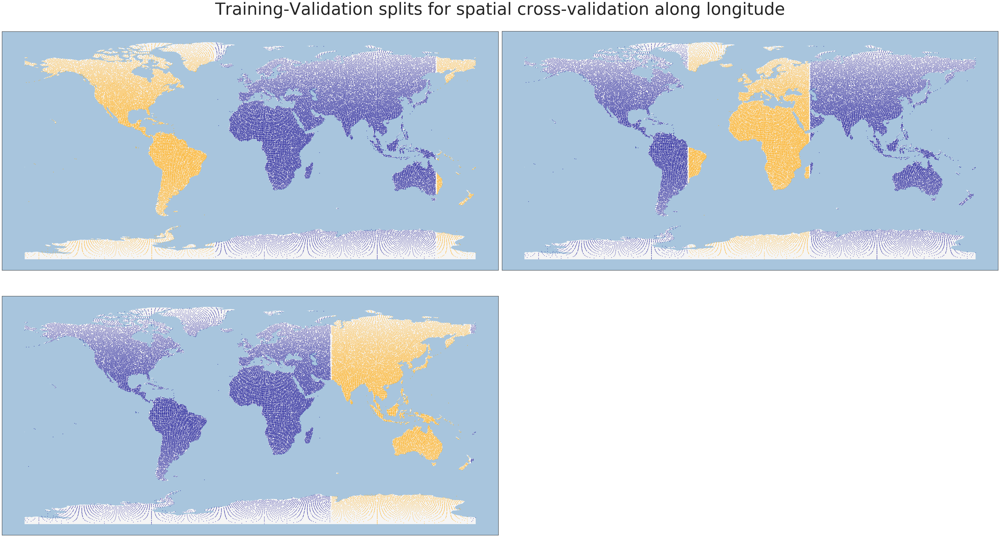

In [21]:
# Visualize training and validation set for each fold of the Spatial CV.
## Buffering areas are the white stripes (no points) around the validation set
with sns.axes_style("white"):
    fig, axs = plt.subplots(nrows = k//2+1, ncols = 2, figsize = (50, 13.5*(k//2+1)))

    for (train, val), ax in zip(folds_indices_x, axs.flat):
        # Training set
        XTG.loc[train].plot(ax = ax, zorder = 2, markersize = 1, marker = 'h',
                            color = 'darkblue', legend = True)
        # Validation set
        XTG.loc[val].plot(ax = ax, zorder = 2, markersize = 1, marker = 'h',
                          color = 'orange', legend = True)

        # World map on the backgroud
        world.plot(ax = ax, zorder = 1, facecolor = "whitesmoke",
                   edgecolor = "none").set_facecolor('#A8C5DD')
        
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    if k%2 == 1: fig.delaxes(axs.flat[-1])
    
    fig.tight_layout()
    
    if save_plot:
        plt.savefig(os.path.join(plot_dir, f'IGBP{lc_id}_{k}FoldSpatialCV_X.jpg'),
                    optimize = True, box_inches = 'tight', dpi = 200)
    fig.suptitle('Training-Validation splits for spatial cross-validation along longitude', 
                 y = 1.02, fontsize = 60)
    
    plt.show()

### Along latitude coordinates

In [22]:
# Number of folds
k = 3
# Generation of training-validation sets
folds_indices_y = SpatialCVSplit(XTG, k, coord = 'y', buffer = buffer, eps = 2) ## Pandas indices
folds_rows_y = Index2RowNum(folds_indices_y, X_train) ## Row numbers

Preparing training set 1 bounds
Preparing training set 2 bounds
Preparing training set 3 bounds

Preparing validation sets bounds

Assigning points to training and validation sets

Converting pandas indices into row numbers.


In [23]:
# Counts and proportions of training, validation sets and buffering areas.
FoldsStats(folds_indices_y, tot_size = X_train.shape[0])

,TrainSetSize,ValidationSetSize,BufferingSize,TrainSetProp,ValidationSetProp,BufferingProp
Fold1,34097,16597,331,66.82,32.53,0.65
Fold2,34142,16161,722,66.91,31.67,1.41
Fold3,34218,16050,757,67.06,31.46,1.48


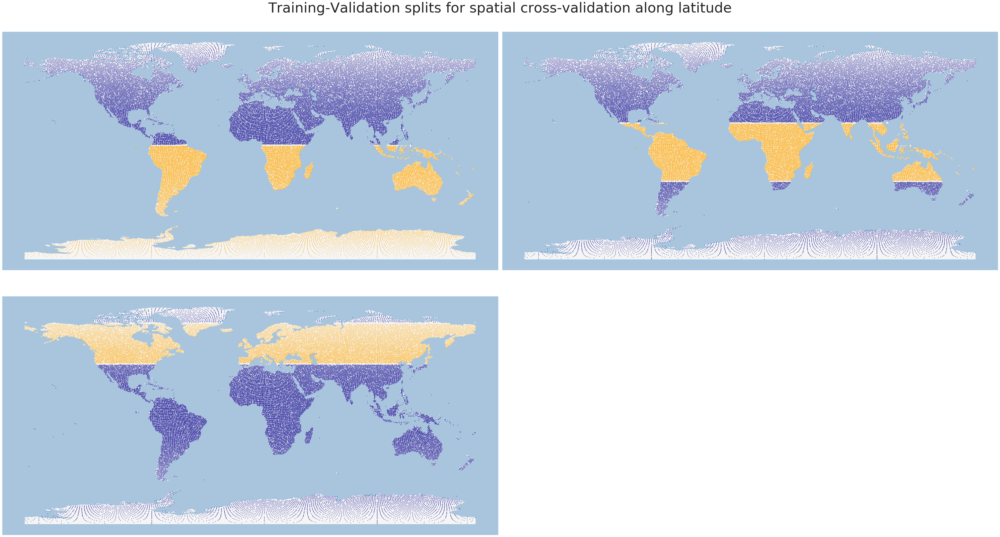

In [24]:
# Visualize training and validation set for each fold of the Spatial CV.
## Buffering areas are the white stripes (no points) around the validation set
with sns.axes_style("dark"):
    fig, axs = plt.subplots(nrows = k//2+1, ncols = 2, figsize = (50, 13.5*(k//2+1)))

    for (train, val), ax in zip(folds_indices_y, axs.flat):
        # Training set
        XTG.loc[train].plot(ax = ax, zorder = 2, markersize = 1, marker = 'h',
                            color = 'darkblue', legend = True)
        # Validation set
        XTG.loc[val].plot(ax = ax, zorder = 2, markersize = 1, marker = 'h',
                          color = 'orange', legend = True)

        # World map on the backgroud
        world.plot(ax = ax, zorder = 1, facecolor = "whitesmoke",
                   edgecolor = "none").set_facecolor('#A8C5DD')
        
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    if k%2 == 1: fig.delaxes(axs.flat[-1])
    
    fig.tight_layout()
    
    if save_plot: 
        plt.savefig(os.path.join(plot_dir, f'IGBP{lc_id}_{k}FoldSpatialCV_Y.jpg'),
                    optimize = True, box_inches = 'tight', dpi = 200)
    fig.suptitle('Training-Validation splits for spatial cross-validation along latitude', 
                 y = 1.02, fontsize = 50)
    
    plt.show()

##  Search of parameters

### Grid search along longitude coordinates 

In [25]:
# Range of max_dept
d_min, d_max = 21, 31

# Hyperparameters for the Grid Search
hyperparams = {'max_depth': list(range(d_min, d_max)), 
               'min_samples_split': [2, 5, 10, 15],
               'ccp_alpha': ccp_alpha}

# Directory to store the Grid Search results
file_dir = os.path.join(processed_data_dir,'RFR_GS_SX.pickle')

if os.path.exists(file_dir):
    with open(file_dir, 'rb') as file: RFR_GS_SX = pickle.load(file)
    print('Grid Search loaded')
else:
    # Grid Search and k-fold CV
    RFR_GS_SX = GridSearchCV(estimator = RandomForestRegressor(criterion = 'mse',
                                                               n_estimators = 100),
                             param_grid = hyperparams,
                             scoring = 'neg_mean_squared_error',
                             cv = folds_rows_x,
                             return_train_score = True,
                             n_jobs = 4,
                             verbose = 5)
    
    RFR_GS_SX.fit(X_train, y_train)

    with open(file_dir, 'wb') as file: pickle.dump(RFR_GS_SX, file)
    print('Grid Search executed')

# Grid Search results
RFR_GS_SX_results = pd.DataFrame(RFR_GS_SX.cv_results_)

Grid Search loaded


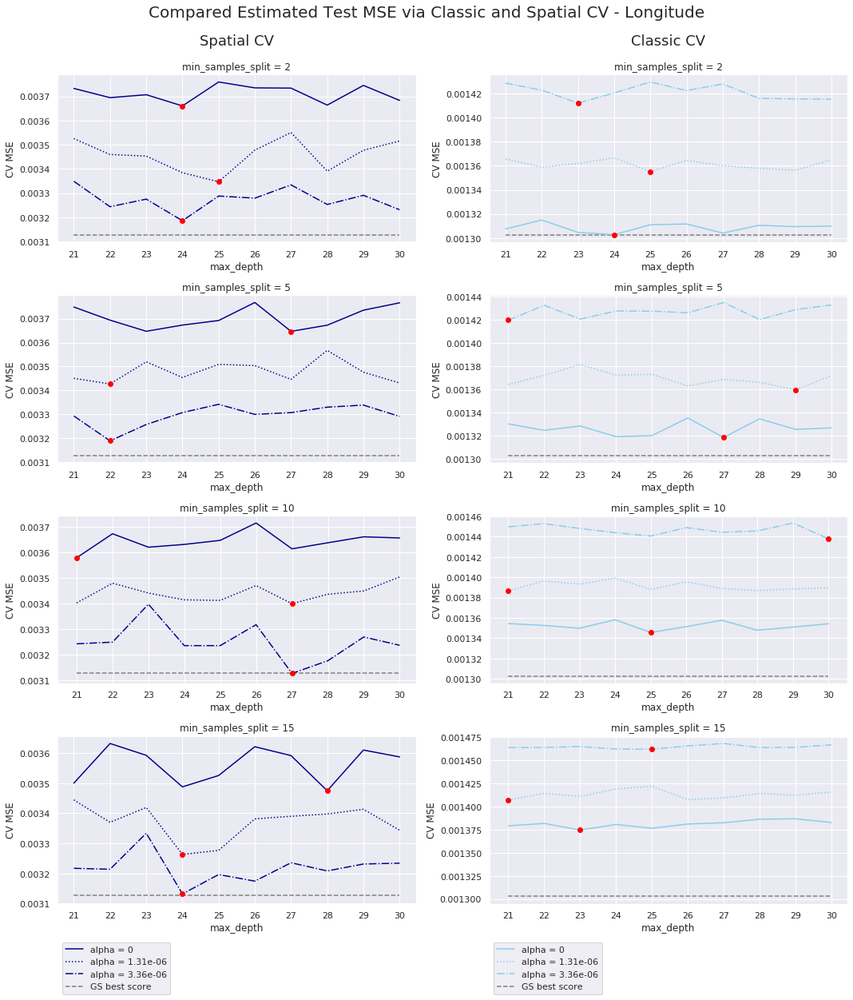

In [26]:
fig, ax = plt.subplots(nrows = 4, ncols = 2, figsize = (15,17))

ls = ['-', ':', '-.']
col = ['darkblue', 'skyblue']

for j in range(2):
    for i, mss in enumerate(hyperparams['min_samples_split']):
        for k, alpha in enumerate(ccp_alpha):
            if j == 0: R = RFR_GS_SX_results
            else: R = RFR_GS_results[RFR_GS_results.param_n_estimators == 100]
                
            MSE = R[(R.param_min_samples_split == mss) & 
                    (R.param_ccp_alpha == alpha)].mean_test_score.values*-1
            ax[i,j].plot(list(range(d_min, d_max)), MSE, linestyle = ls[k], 
                       color = col[j], label = f'alpha = {alpha}', zorder = 1)
            ax[i,j].scatter(d_min+np.argmin(MSE), min(MSE), color = 'red', zorder = 2)

        ax[i,j].hlines(R.mean_test_score.max()*-1, xmin = d_min, xmax = d_max-1, zorder = 1,
                     color = 'gray', linestyles = 'dashed', label = f'GS best score')

        ax[i,j].set(xticks = list(range(d_min, d_max)), title = f'min_samples_split = {mss}',
                  xlabel = 'max_depth', ylabel = 'CV MSE')

    ax[-1,j].legend(bbox_to_anchor = (0, -0.2), loc = "upper left")
ax[0,0].text(x = 0.5, y = 1.2, s = "Spatial CV", size = 18, horizontalalignment='center',
             verticalalignment='center', transform = ax[0,0].transAxes)
ax[0,1].text(x = 0.5, y = 1.2, s = "Classic CV", size = 18, horizontalalignment='center',
             verticalalignment='center', transform = ax[0,1].transAxes)

fig.tight_layout()

if save_plot:
    plt.savefig(os.path.join(plot_dir, f'IGBP{lc_id}_RFR_GS_SX_results.jpg'),
                optimize = True, box_inches = 'tight', dpi = 200)
fig.suptitle('Compared Estimated Test MSE via Classic and Spatial CV - Longitude',
             y = 1.02, size = 20)
plt.show()

### Grid search along latitude coordinates 

In [27]:
# Range of max_dept
d_min, d_max = 21, 31

# Hyperparameters for the Grid Search
hyperparams = {'max_depth': list(range(d_min, d_max)), 
               'min_samples_split': [2, 5, 10, 15],
               'ccp_alpha': ccp_alpha}

# Directory to store the Grid Search results
file_dir = os.path.join(processed_data_dir,'RFR_GS_SY.pickle')

if os.path.exists(file_dir):
    with open(file_dir, 'rb') as file: RFR_GS_SY = pickle.load(file)
    print('Grid Search loaded')
else:
    # Grid Search and k-fold CV
    RFR_GS_SY = GridSearchCV(estimator = RandomForestRegressor(criterion = 'mse',
                                                               n_estimators = 100),
                             param_grid = hyperparams,
                             scoring = 'neg_mean_squared_error',
                             cv = folds_rows_y,
                             return_train_score = True,
                             n_jobs = 4,
                             verbose = 5)
    
    RFR_GS_SY.fit(X_train, y_train)

    with open(file_dir, 'wb') as file: pickle.dump(RFR_GS_SY, file)
    print('Grid Search executed')

# Grid Search results
RFR_GS_SY_results = pd.DataFrame(RFR_GS_SY.cv_results_)

Grid Search loaded


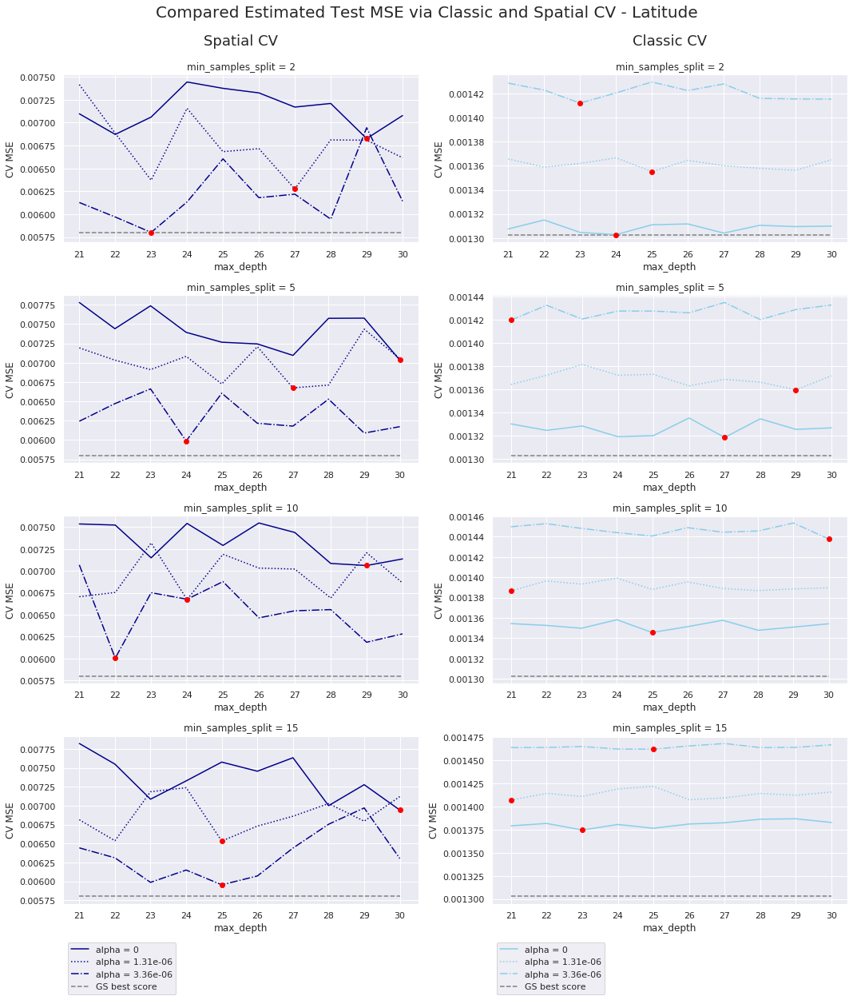

In [28]:
fig, ax = plt.subplots(nrows = 4, ncols = 2, figsize = (15,17))

ls = ['-', ':', '-.']
col = ['darkblue', 'skyblue']

for j in range(2):
    for i, mss in enumerate(hyperparams['min_samples_split']):
        for k, alpha in enumerate(ccp_alpha):
            if j == 0: R = RFR_GS_SY_results
            else: R = RFR_GS_results[RFR_GS_results.param_n_estimators == 100]
                
            MSE = R[(R.param_min_samples_split == mss) & 
                    (R.param_ccp_alpha == alpha)].mean_test_score.values*-1
            ax[i,j].plot(list(range(d_min, d_max)), MSE, linestyle = ls[k], 
                       color = col[j], label = f'alpha = {alpha}', zorder = 1)
            ax[i,j].scatter(d_min+np.argmin(MSE), min(MSE), color = 'red', zorder = 2)

        ax[i,j].hlines(R.mean_test_score.max()*-1, xmin = d_min, xmax = d_max-1, zorder = 1,
                     color = 'gray', linestyles = 'dashed', label = f'GS best score')

        ax[i,j].set(xticks = list(range(d_min, d_max)), title = f'min_samples_split = {mss}',
                  xlabel = 'max_depth', ylabel = 'CV MSE')

    ax[-1,j].legend(bbox_to_anchor = (0, -0.2), loc = "upper left")
ax[0,0].text(x = 0.5, y = 1.2, s = "Spatial CV", size = 18, horizontalalignment='center',
             verticalalignment='center', transform = ax[0,0].transAxes)
ax[0,1].text(x = 0.5, y = 1.2, s = "Classic CV", size = 18, horizontalalignment='center',
             verticalalignment='center', transform = ax[0,1].transAxes)

fig.tight_layout()

if save_plot:
    plt.savefig(os.path.join(plot_dir, f'IGBP{lc_id}_RFR_GS_SY_results.jpg'),
                optimize = True, box_inches = 'tight', dpi = 200)
fig.suptitle('Compared Estimated Test MSE via Classic and Spatial CV - Latitude',
             y = 1.02, size = 20)
plt.show()